In [231]:
# Install the pytorch-grad-cam library
!pip install grad-cam

# Import necessary libraries
import os
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms, datasets
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.reshape_transforms import vit_reshape_transform
import random
from torchvision import models

In [233]:
# Define dataset path
dataset_path = "/kaggle/input/original-data-monkeypox/Monkeypox Skin Images Dataset (MSID)/Monkeypox Skin Image Dataset/Monkeypox Skin Image Dataset"



# Preprocessing for DeiT
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load dataset
dataset = datasets.ImageFolder(root=dataset_path, transform=preprocess)
class_names = dataset.classes

In [483]:
# Define a fixed list of indices to ensure the same images are used
indices = list(range(len(dataset)))  # Create a list of dataset indices
np.random.seed(23)  # Fix the seed for reproducibility
np.random.shuffle(indices) 

# **DEiT**

In [457]:
# Load the DeiT architecture
model = torch.hub.load('facebookresearch/deit:main', 'deit_base_patch16_224', pretrained=True)
#model.eval()


Using cache found in /root/.cache/torch/hub/facebookresearch_deit_main


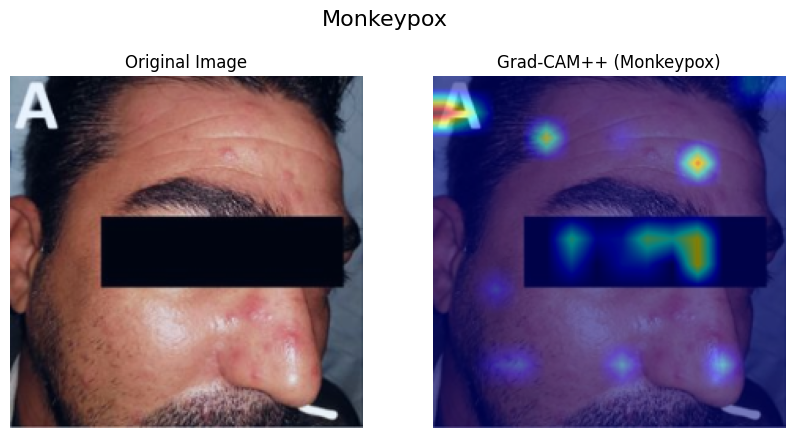

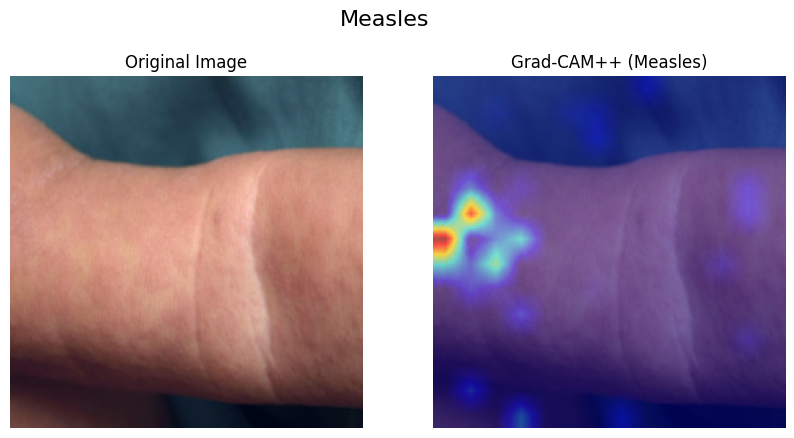

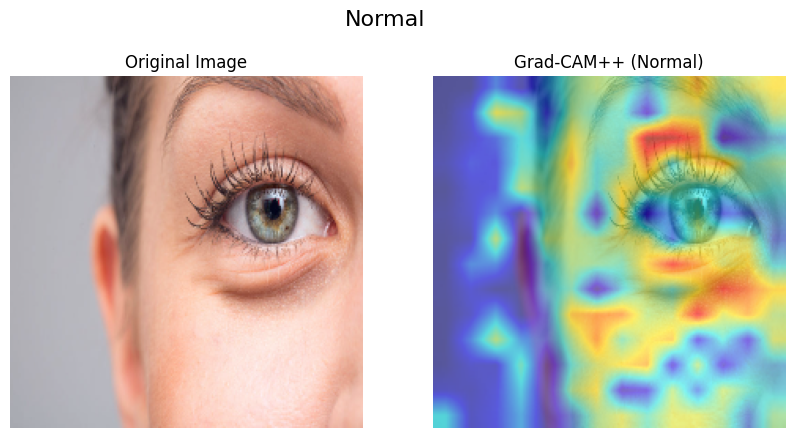

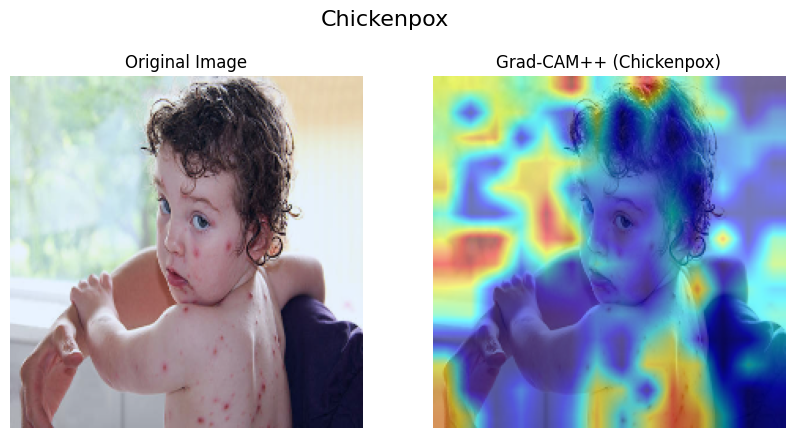

In [484]:
## Define Grad-CAM++ visualization function
def generate_gradcam_vit(model, dataset, indices, target_layer_name, class_names):
    """
    Generate Grad-CAM++ visualizations for a Vision Transformer model with random image selection.
    """
    # Get the target layer for Grad-CAM++
    target_layer = dict([*model.named_modules()])[target_layer_name]

    # Initialize Grad-CAM++ with the target layer
    cam = GradCAMPlusPlus(
        model=model,
        target_layers=[target_layer],
        reshape_transform=vit_reshape_transform  # Handles ViT-specific reshaping
    )

    processed_classes = set()
    
    for idx in indices:  # Iterate over shuffled indices
        image, label = dataset[idx]

        # Skip if the class is already processed
        if label in processed_classes:
            continue
        
        # Add the batch dimension to the image
        input_tensor = image.unsqueeze(0)

        # Generate Grad-CAM++ heatmap
        targets = [ClassifierOutputTarget(label)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

        # Normalize and overlay the heatmap
        grayscale_cam = grayscale_cam[0, :]
        image_np = image.permute(1, 2, 0).numpy()  # Convert tensor to numpy
        image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())  # Normalize to [0, 1]
        cam_image = show_cam_on_image(image_np, grayscale_cam, use_rgb=True)

        # Plot original image and Grad-CAM++ visualization
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(f"{class_names[label]}", fontsize=16)

        # Original image
        axes[0].imshow(image_np)
        axes[0].axis('off')
        axes[0].set_title(f"Original Image")

        # Grad-CAM++ overlay
        axes[1].imshow(cam_image)
        axes[1].axis('off')
        axes[1].set_title(f"Grad-CAM++ ({class_names[label]})")

        plt.show()

        # Mark the class as processed
        processed_classes.add(label)

        # Stop if all classes have been processed
        if len(processed_classes) == len(class_names):
            break

# Use a better target layer for spatial information
target_layer_name = "blocks.11.norm1"  # Second-to-last block's norm1 layer

# Generate Grad-CAM++ visualizations with random images
generate_gradcam_vit(model, dataset, indices, target_layer_name, class_names)


# **ViT**

In [485]:
import timm
# Load Vision Transformer model from timm
model = timm.create_model('vit_base_patch16_224.orig_in21k_ft_in1k', pretrained=True)

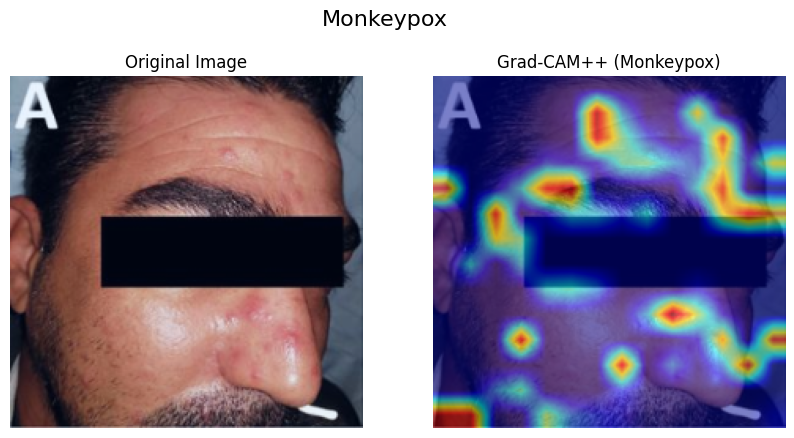

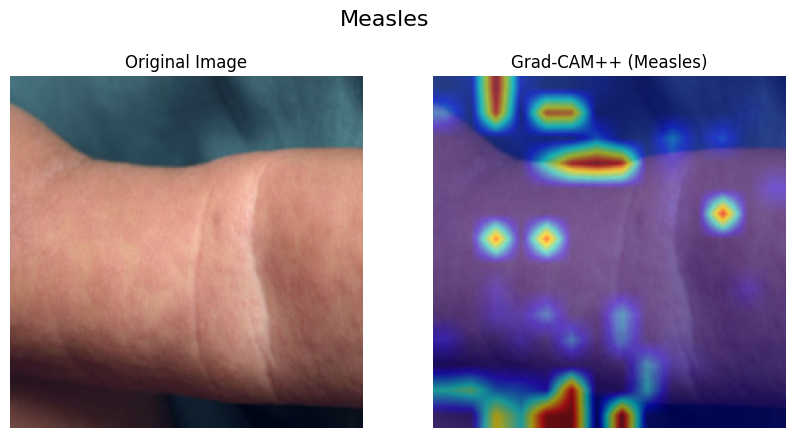

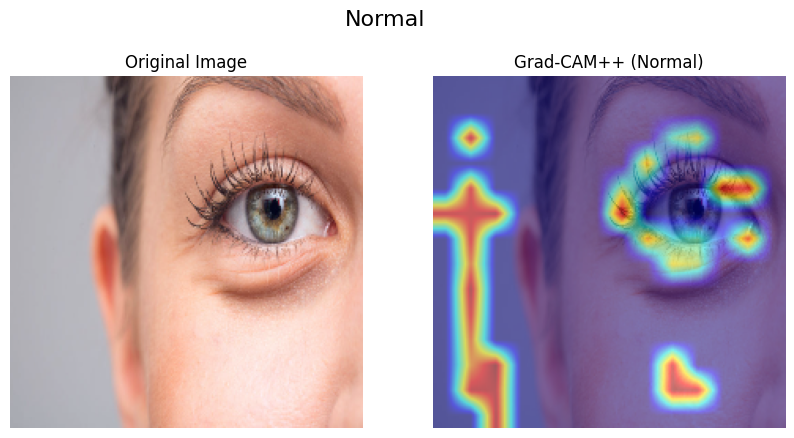

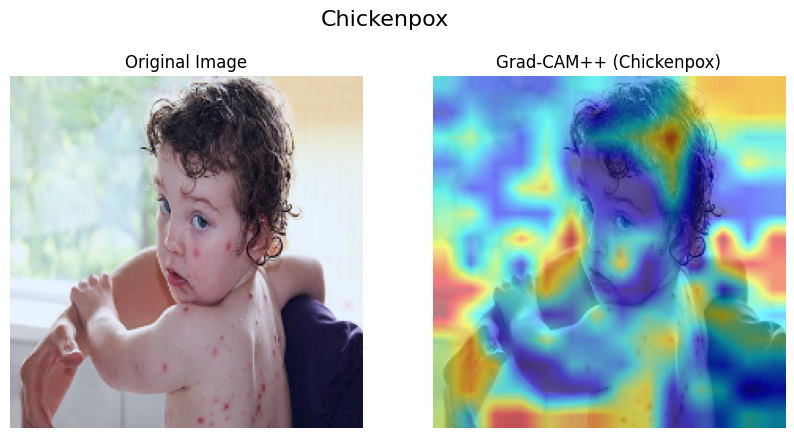

In [486]:
# Grad-CAM++ visualization function for Vision Transformer
def generate_gradcam_vit(model, dataset, indices, target_layer_name, class_names):
    """
    Generate Grad-CAM++ visualizations for a Vision Transformer model with fixed images.
    """
    # Get the target layer for Grad-CAM++
    target_layer = dict([*model.named_modules()])[target_layer_name]

    # Initialize Grad-CAM++ with the target layer
    cam = GradCAMPlusPlus(
        model=model,
        target_layers=[target_layer],
        reshape_transform=vit_reshape_transform  # Handles ViT-specific reshaping
    )

    processed_classes = set()

    for idx in indices:  # Use the same fixed indices
        image, label = dataset[idx]

        if label in processed_classes:  # Skip already processed classes
            continue

        input_tensor = image.unsqueeze(0)  # Add batch dimension
        targets = [ClassifierOutputTarget(label)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

        # Normalize and overlay the heatmap
        grayscale_cam = grayscale_cam[0, :]
        image_np = image.permute(1, 2, 0).numpy()
        image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())
        cam_image = show_cam_on_image(image_np, grayscale_cam, use_rgb=True)

        # Plot original image and Grad-CAM++ overlay
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(f"{class_names[label]}", fontsize=16)
        axes[0].imshow(image_np)
        axes[0].axis('off')
        axes[0].set_title(f"Original Image")
        axes[1].imshow(cam_image)
        axes[1].axis('off')
        axes[1].set_title(f"Grad-CAM++ ({class_names[label]})")
        plt.show()

        processed_classes.add(label)
        if len(processed_classes) == len(class_names):  # Stop if all classes are processed
            break

# Use a target layer appropriate for ViT
target_layer_name = "blocks.11.norm1"  # Second-to-last block's norm1 layer

# Generate Grad-CAM++ visualizations
generate_gradcam_vit(model, dataset, indices, target_layer_name, class_names)

# Densenet169

In [487]:
# Load the DenseNet169 model
model = torch.hub.load('pytorch/vision:v0.10.0', 'densenet169', pretrained=True)
#model.eval()

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


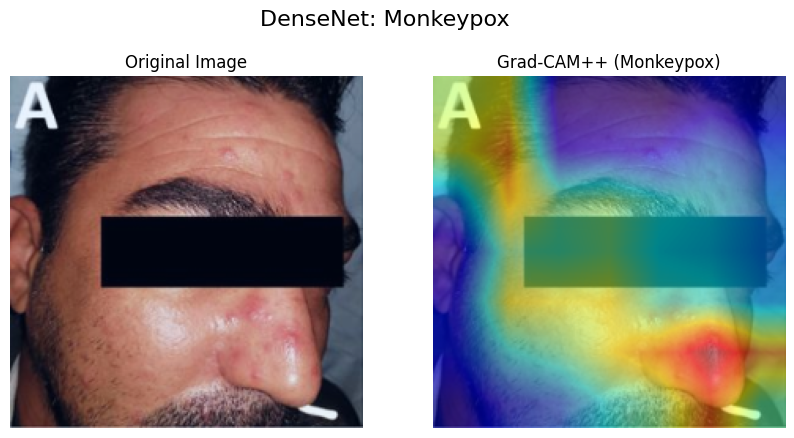

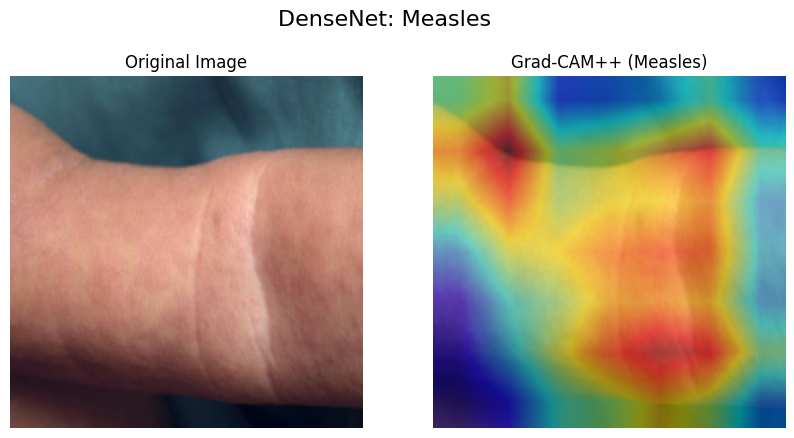

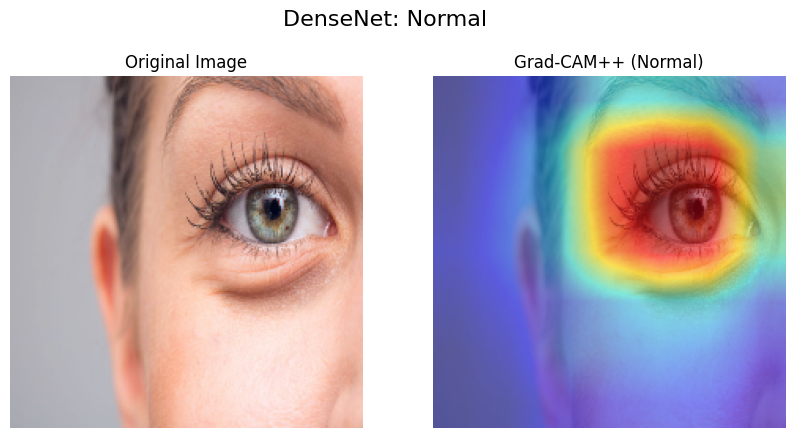

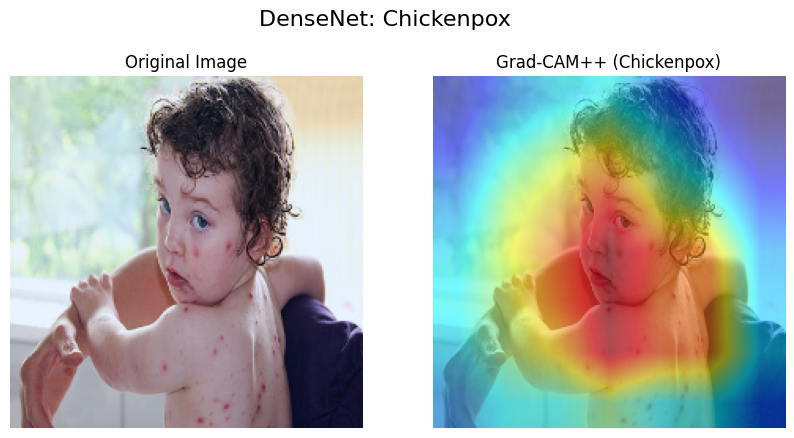

In [488]:
# Define Grad-CAM++ visualization function for CNNs
def generate_gradcam_cnn(model, dataset, indices, target_layer_name, class_names):
    """
    Generate Grad-CAM++ visualizations for CNN models like DenseNet.
    """
    target_layer = dict([*model.named_modules()])[target_layer_name]
    cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])

    processed_classes = set()

    for idx in indices:  # Use fixed indices
        image, label = dataset[idx]

        if label in processed_classes:  # Skip already processed classes
            continue

        input_tensor = image.unsqueeze(0)  # Add batch dimension
        targets = [ClassifierOutputTarget(label)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

        # Normalize and overlay the heatmap
        grayscale_cam = grayscale_cam[0, :]
        image_np = image.permute(1, 2, 0).numpy()
        image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())
        cam_image = show_cam_on_image(image_np, grayscale_cam, use_rgb=True)

        # Plot original image and Grad-CAM++ overlay
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(f"DenseNet: {class_names[label]}", fontsize=16)
        axes[0].imshow(image_np)
        axes[0].axis('off')
        axes[0].set_title(f"Original Image")
        axes[1].imshow(cam_image)
        axes[1].axis('off')
        axes[1].set_title(f"Grad-CAM++ ({class_names[label]})")
        plt.show()

        processed_classes.add(label)
        if len(processed_classes) == len(class_names):  # Stop if all classes are processed
            break

# Use an appropriate target layer for DenseNet
target_layer_name = "features.denseblock4"  # You can also use "features.norm5" if needed

# Generate Grad-CAM++ visualizations
generate_gradcam_cnn(model, dataset, indices, target_layer_name, class_names)

# **Resnet101**

In [489]:

# Load ResNet101
model_resnet101 = models.resnet101(pretrained=True)
#model_resnet101.eval()

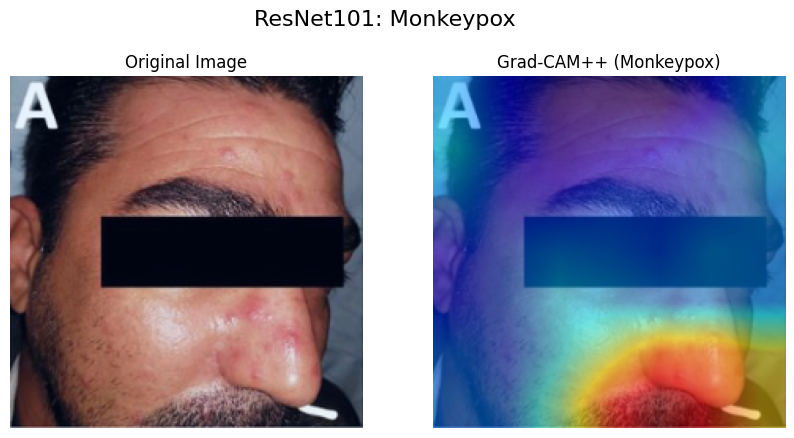

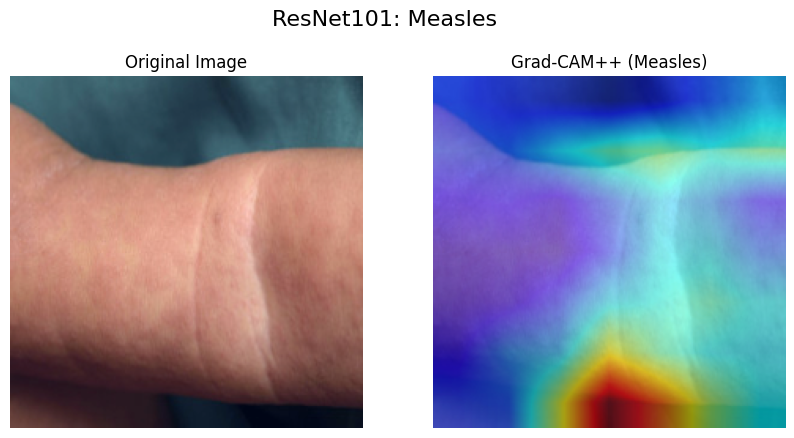

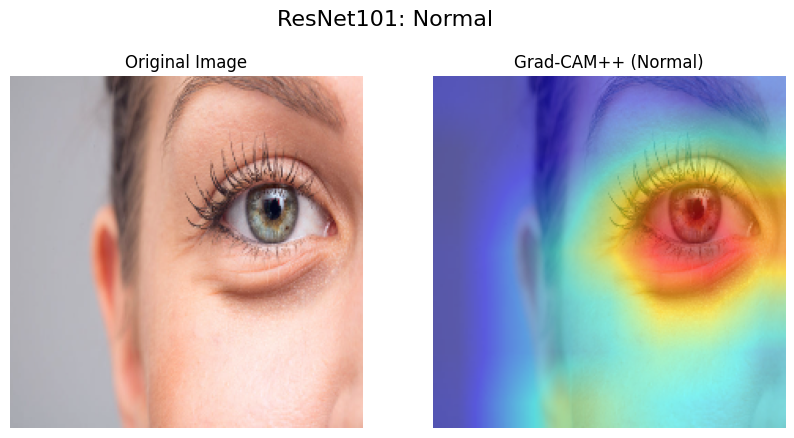

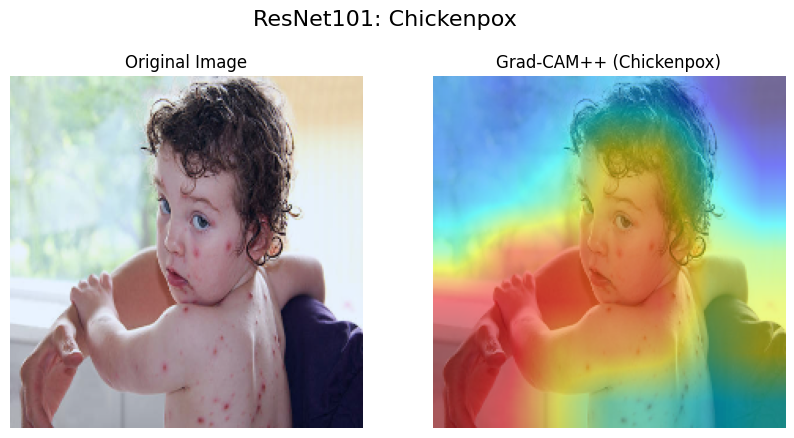

In [490]:

# Define Grad-CAM++ visualization function for ResNet101
def generate_gradcam_resnet101(model, dataset, indices, target_layer_name, class_names):
    """
    Generate Grad-CAM++ visualizations for ResNet101.
    """
    target_layer = dict([*model.named_modules()])[target_layer_name]
    cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])

    processed_classes = set()

    for idx in indices:
        image, label = dataset[idx]

        if label in processed_classes:
            continue

        input_tensor = image.unsqueeze(0)
        targets = [ClassifierOutputTarget(label)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

        grayscale_cam = grayscale_cam[0, :]
        image_np = image.permute(1, 2, 0).numpy()
        image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())
        cam_image = show_cam_on_image(image_np, grayscale_cam, use_rgb=True)

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(f"ResNet101: {class_names[label]}", fontsize=16)
        axes[0].imshow(image_np)
        axes[0].axis('off')
        axes[0].set_title("Original Image")
        axes[1].imshow(cam_image)
        axes[1].axis('off')
        axes[1].set_title(f"Grad-CAM++ ({class_names[label]})")
        plt.show()

        processed_classes.add(label)
        if len(processed_classes) == len(class_names):
            break

# Set target layer and visualize
target_layer_name_resnet101 = "layer4"
generate_gradcam_resnet101(model_resnet101, dataset, indices, target_layer_name_resnet101, class_names)


# **ResNet152**

In [491]:
# Load ResNet152
model_resnet152 = models.resnet152(pretrained=True)
#model_resnet152.eval()


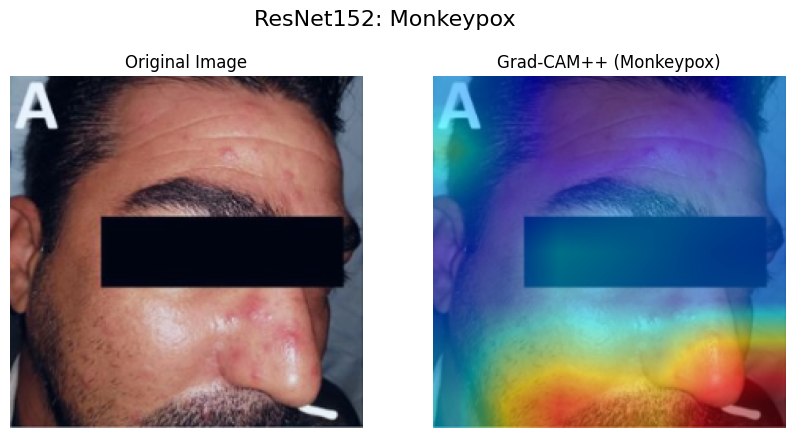

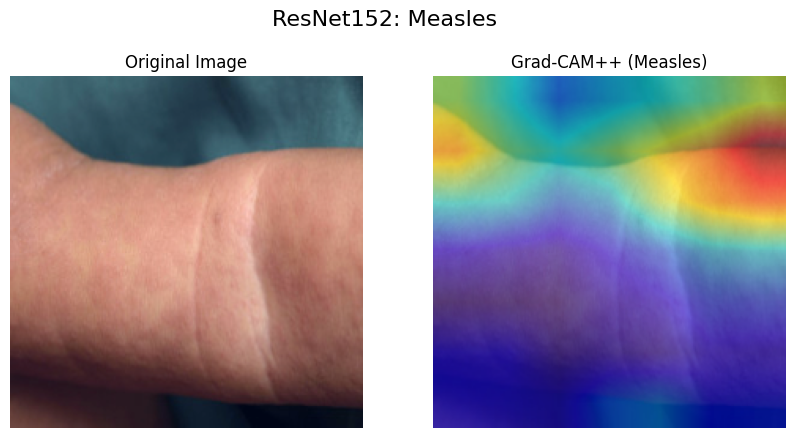

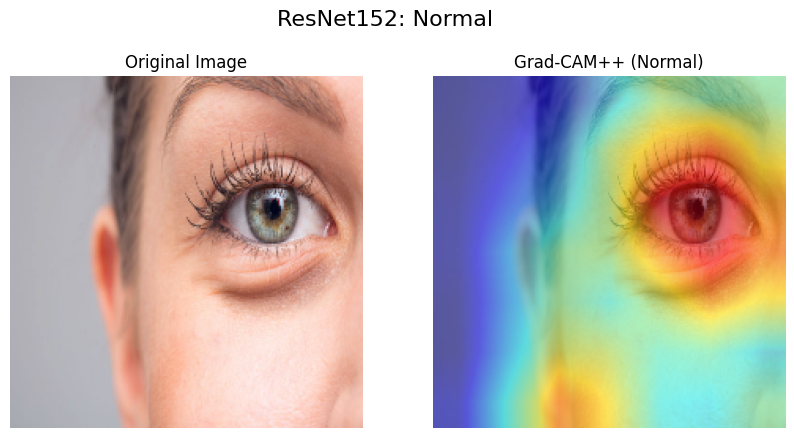

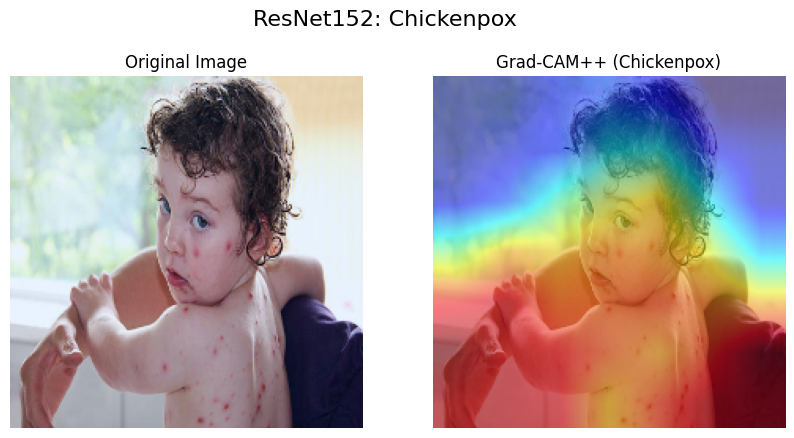

In [492]:
# Define Grad-CAM++ visualization function for ResNet152
def generate_gradcam_resnet152(model, dataset, indices, target_layer_name, class_names):
    """
    Generate Grad-CAM++ visualizations for ResNet152.
    """
    target_layer = dict([*model.named_modules()])[target_layer_name]
    cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])

    processed_classes = set()

    for idx in indices:
        image, label = dataset[idx]

        if label in processed_classes:
            continue

        input_tensor = image.unsqueeze(0)
        targets = [ClassifierOutputTarget(label)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

        grayscale_cam = grayscale_cam[0, :]
        image_np = image.permute(1, 2, 0).numpy()
        image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())
        cam_image = show_cam_on_image(image_np, grayscale_cam, use_rgb=True)

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(f"ResNet152: {class_names[label]}", fontsize=16)
        axes[0].imshow(image_np)
        axes[0].axis('off')
        axes[0].set_title("Original Image")
        axes[1].imshow(cam_image)
        axes[1].axis('off')
        axes[1].set_title(f"Grad-CAM++ ({class_names[label]})")
        plt.show()

        processed_classes.add(label)
        if len(processed_classes) == len(class_names):
            break

# Set target layer and visualize
target_layer_name_resnet152 = "layer4"
generate_gradcam_resnet152(model_resnet152, dataset, indices, target_layer_name_resnet152, class_names)

# **InceptionV4**

In [493]:

model_inceptionv4 = timm.create_model('inception_v4', pretrained=True)
#model_inceptionv4.eval()

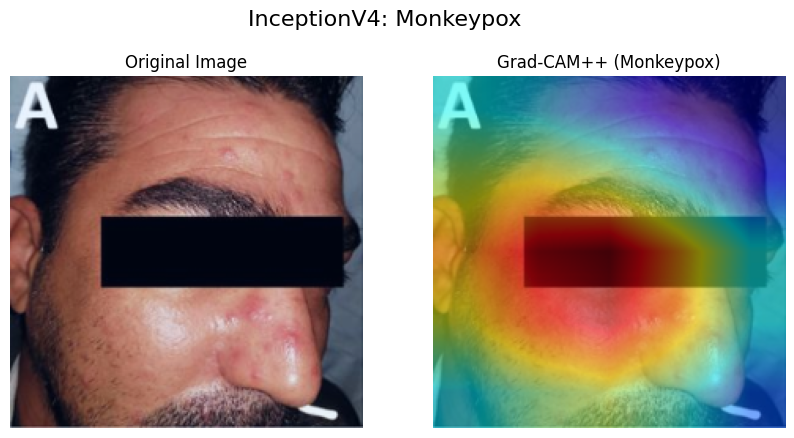

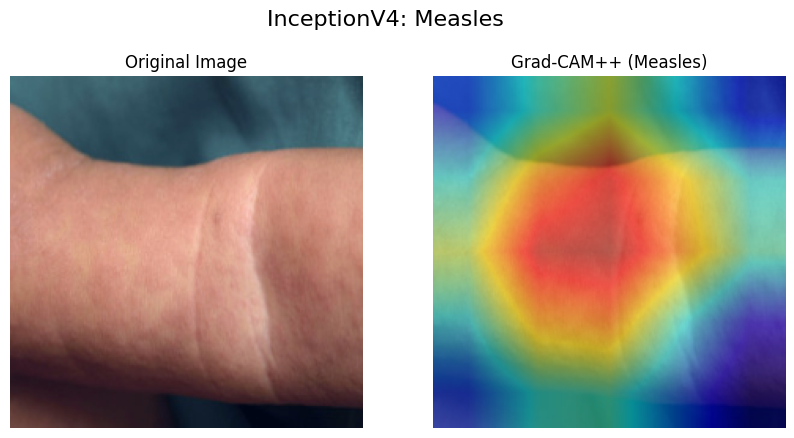

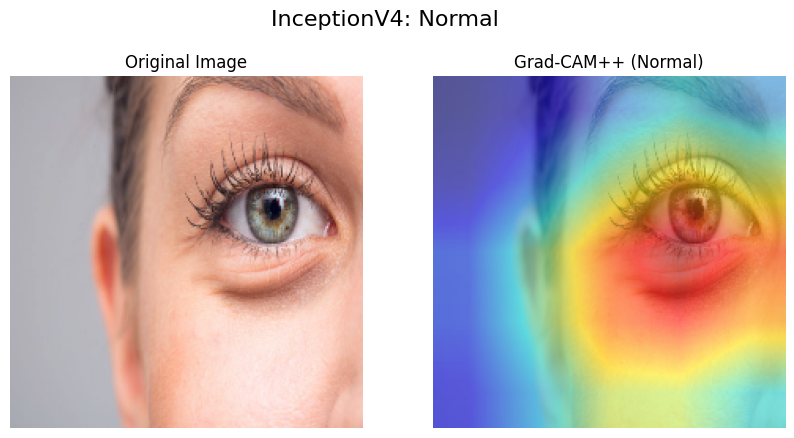

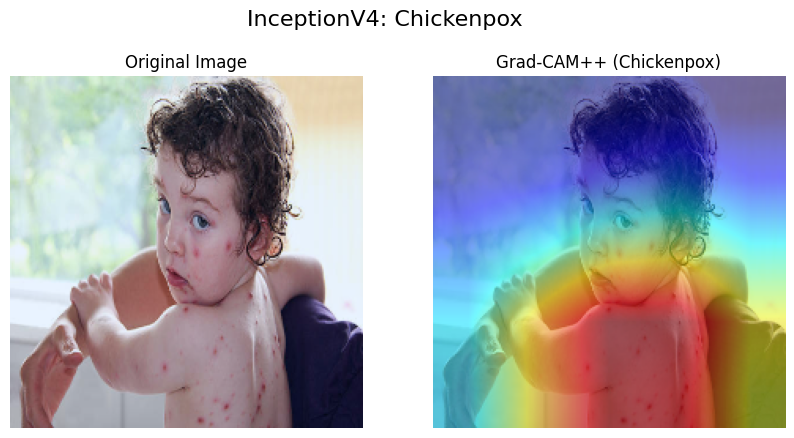

In [494]:
# Load InceptionV4


# Define Grad-CAM++ visualization function for InceptionV4
def generate_gradcam_inceptionv4(model, dataset, indices, target_layer_name, class_names):
    """
    Generate Grad-CAM++ visualizations for InceptionV4.
    """
    target_layer = dict([*model.named_modules()])[target_layer_name]
    cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])

    processed_classes = set()

    for idx in indices:
        image, label = dataset[idx]

        if label in processed_classes:
            continue

        input_tensor = image.unsqueeze(0)
        targets = [ClassifierOutputTarget(label)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

        grayscale_cam = grayscale_cam[0, :]
        image_np = image.permute(1, 2, 0).numpy()
        image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())
        cam_image = show_cam_on_image(image_np, grayscale_cam, use_rgb=True)

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(f"InceptionV4: {class_names[label]}", fontsize=16)
        axes[0].imshow(image_np)
        axes[0].axis('off')
        axes[0].set_title("Original Image")
        axes[1].imshow(cam_image)
        axes[1].axis('off')
        axes[1].set_title(f"Grad-CAM++ ({class_names[label]})")
        plt.show()

        processed_classes.add(label)
        if len(processed_classes) == len(class_names):
            break

# Set target layer and visualize
target_layer_name_inceptionv4 = "features.21"

generate_gradcam_inceptionv4(model_inceptionv4, dataset, indices, target_layer_name_inceptionv4, class_names)


# **EfficientNet_B5**

In [495]:
# Load EfficientNet_B5
model_efficientnetb5 = timm.create_model('efficientnet_b5', pretrained=True)
#model_efficientnetb5.eval()

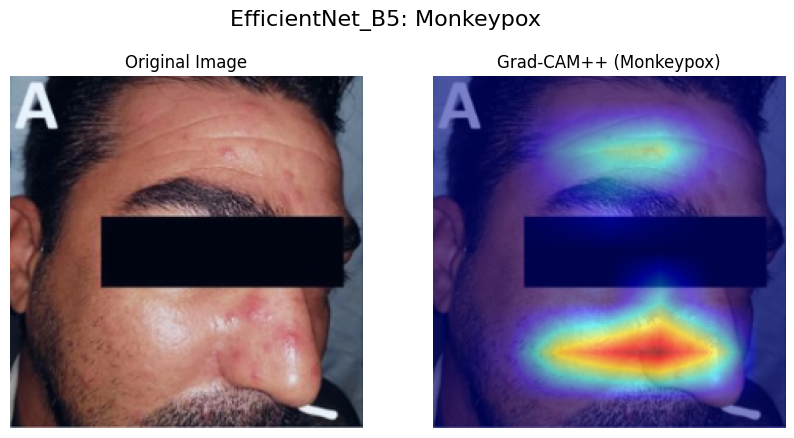

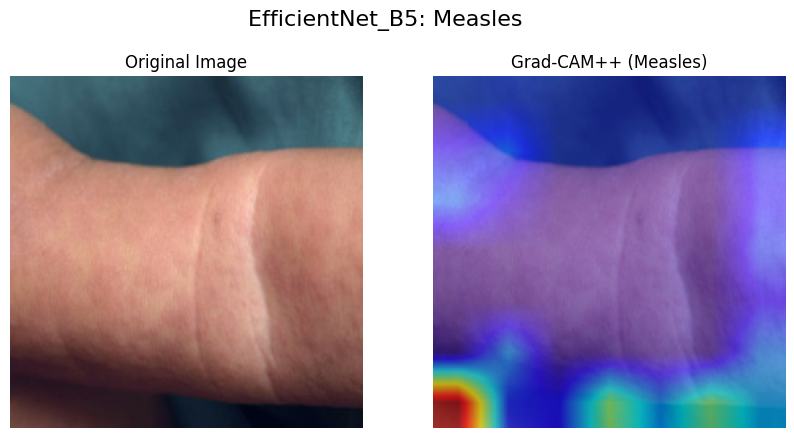

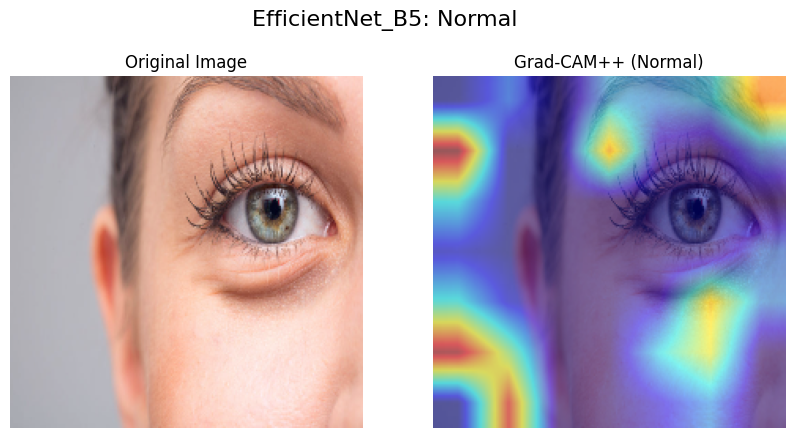

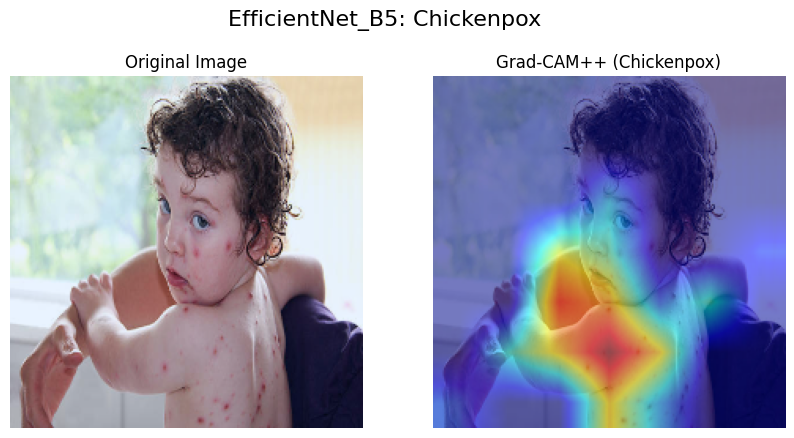

In [496]:

# Define Grad-CAM++ visualization function for EfficientNet_B5
def generate_gradcam_efficientnetb5(model, dataset, indices, target_layer_name, class_names):
    target_layer = dict([*model.named_modules()])[target_layer_name]
    cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])

    processed_classes = set()
    for idx in indices:
        image, label = dataset[idx]
        if label in processed_classes:
            continue

        input_tensor = image.unsqueeze(0)
        targets = [ClassifierOutputTarget(label)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
        grayscale_cam = grayscale_cam[0, :]
        image_np = image.permute(1, 2, 0).numpy()
        image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())
        cam_image = show_cam_on_image(image_np, grayscale_cam, use_rgb=True)

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(f"EfficientNet_B5: {class_names[label]}", fontsize=16)
        axes[0].imshow(image_np)
        axes[0].axis('off')
        axes[0].set_title("Original Image")
        axes[1].imshow(cam_image)
        axes[1].axis('off')
        axes[1].set_title(f"Grad-CAM++ ({class_names[label]})")
        plt.show()

        processed_classes.add(label)
        if len(processed_classes) == len(class_names):
            break

# Visualize
generate_gradcam_efficientnetb5(model_efficientnetb5, dataset, indices, "blocks.5", class_names)


# **VGG16**

In [497]:
# Load VGG16
model_vgg16 = models.vgg16(pretrained=True)
#model_vgg16.eval()


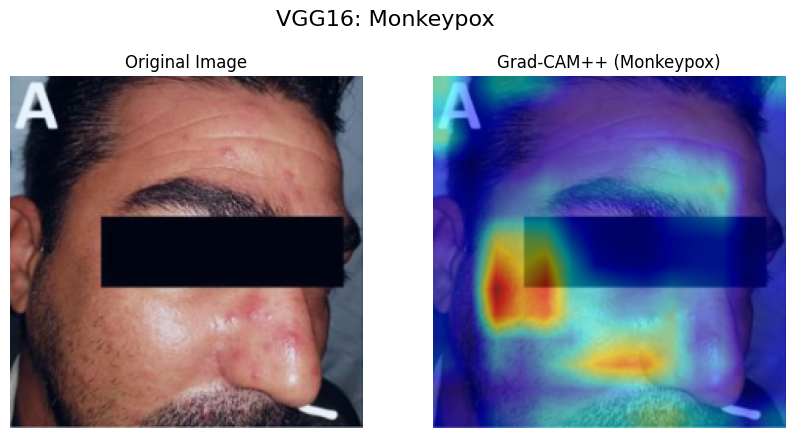

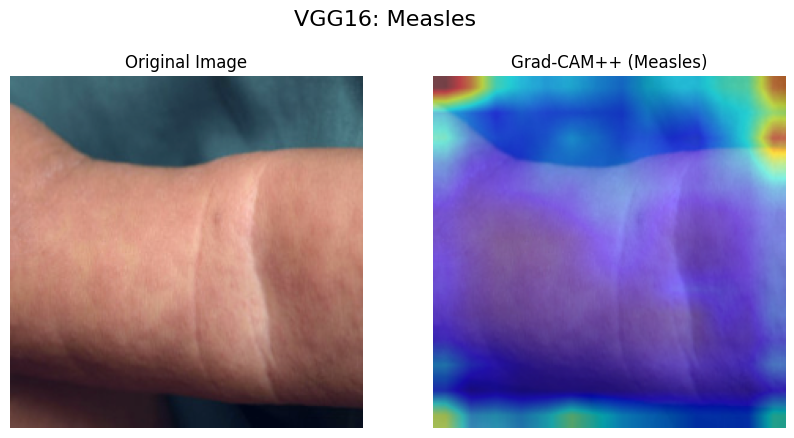

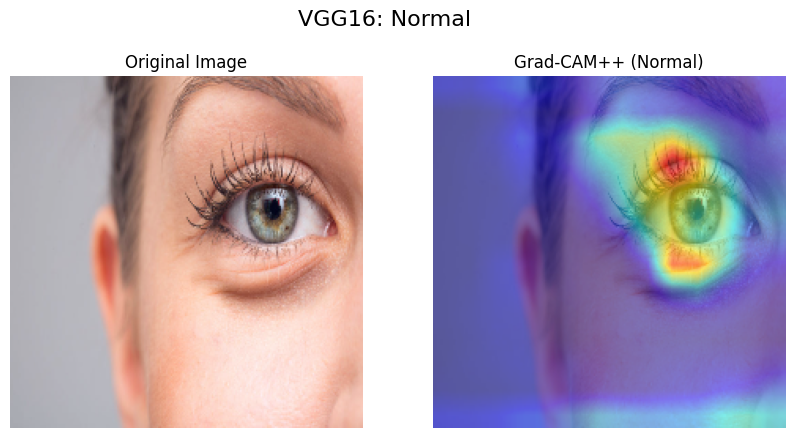

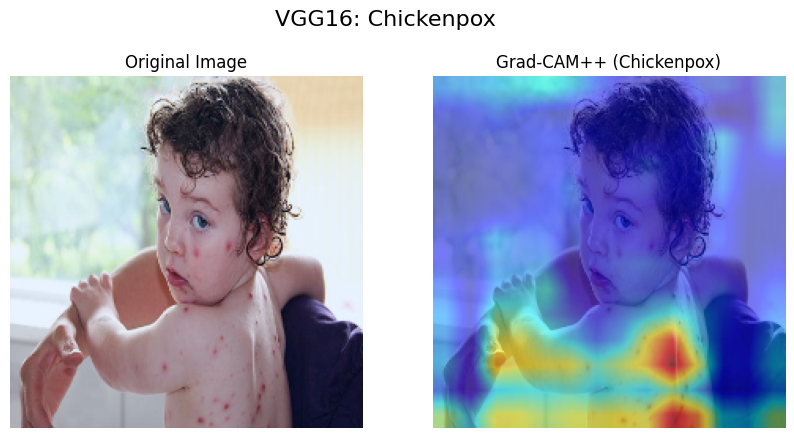

In [498]:

# Define Grad-CAM++ visualization function for VGG16
def generate_gradcam_vgg16(model, dataset, indices, target_layer_name, class_names):
    target_layer = dict([*model.named_modules()])[target_layer_name]
    cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])

    processed_classes = set()
    for idx in indices:
        image, label = dataset[idx]
        if label in processed_classes:
            continue

        input_tensor = image.unsqueeze(0)
        targets = [ClassifierOutputTarget(label)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
        grayscale_cam = grayscale_cam[0, :]
        image_np = image.permute(1, 2, 0).numpy()
        image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())
        cam_image = show_cam_on_image(image_np, grayscale_cam, use_rgb=True)

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(f"VGG16: {class_names[label]}", fontsize=16)
        axes[0].imshow(image_np)
        axes[0].axis('off')
        axes[0].set_title("Original Image")
        axes[1].imshow(cam_image)
        axes[1].axis('off')
        axes[1].set_title(f"Grad-CAM++ ({class_names[label]})")
        plt.show()

        processed_classes.add(label)
        if len(processed_classes) == len(class_names):
            break

# Visualize
generate_gradcam_vgg16(model_vgg16, dataset, indices, "features.29", class_names)


# **Xception71**

In [499]:
model_xception71 = timm.create_model('xception71', pretrained=True)
#model_xception71.eval()

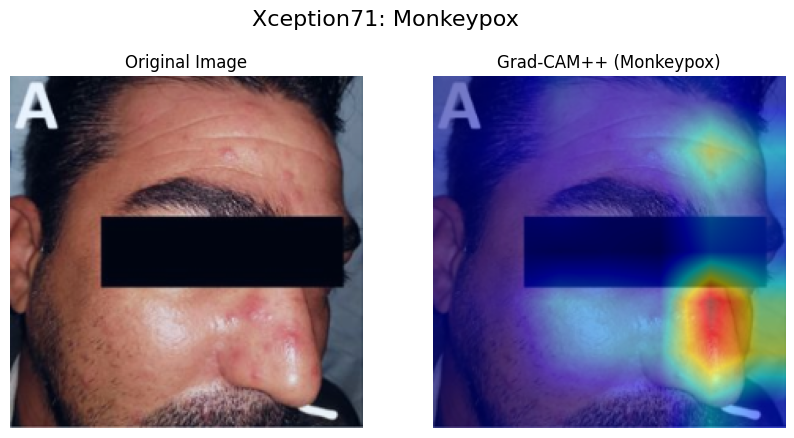

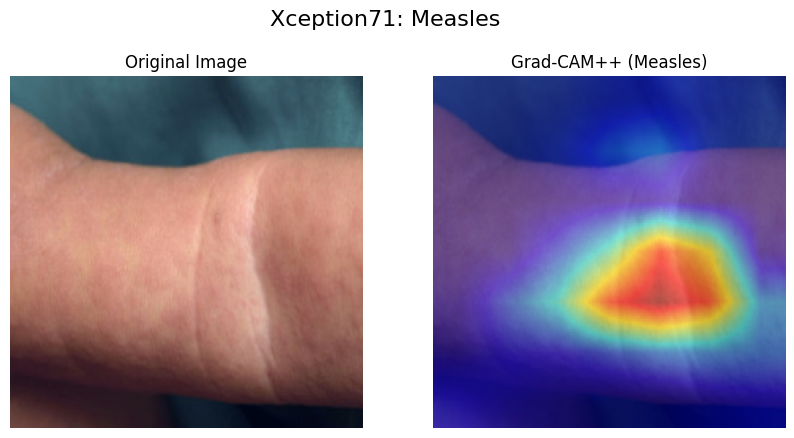

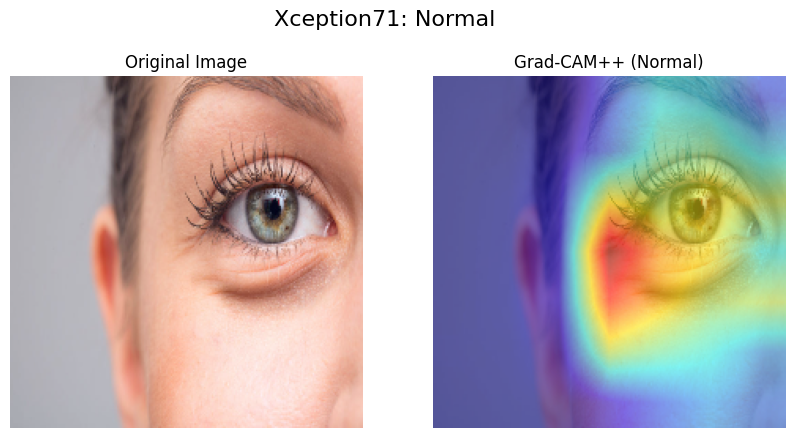

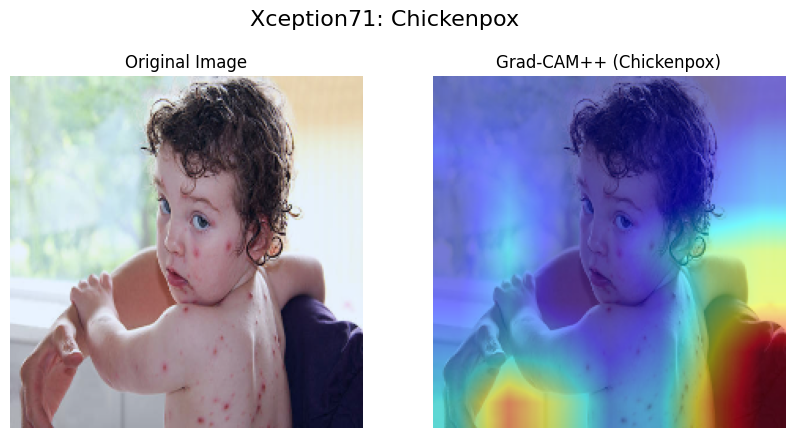

In [500]:
# Define Grad-CAM++ visualization function for Xception
def generate_gradcam_xception71(model, dataset, indices, target_layer_name, class_names):
    """
    Generate Grad-CAM++ visualizations for the Xception model.
    """
    target_layer = dict([*model.named_modules()])[target_layer_name]
    cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])

    processed_classes = set()

    for idx in indices:  # Use fixed indices
        image, label = dataset[idx]

        if label in processed_classes:  # Skip already processed classes
            continue

        input_tensor = image.unsqueeze(0)  # Add batch dimension
        targets = [ClassifierOutputTarget(label)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

        # Normalize and overlay the heatmap
        grayscale_cam = grayscale_cam[0, :]
        image_np = image.permute(1, 2, 0).numpy()
        image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())
        cam_image = show_cam_on_image(image_np, grayscale_cam, use_rgb=True)

        # Plot original image and Grad-CAM++ overlay
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(f"Xception71: {class_names[label]}", fontsize=16)
        axes[0].imshow(image_np)
        axes[0].axis('off')
        axes[0].set_title("Original Image")
        axes[1].imshow(cam_image)
        axes[1].axis('off')
        axes[1].set_title(f"Grad-CAM++ ({class_names[label]})")
        plt.show()

        processed_classes.add(label)
        if len(processed_classes) == len(class_names):  # Stop if all classes are processed
            break

# Set target layer and visualize
target_layer_name_xception71 = "blocks.22.stack.conv3"
generate_gradcam_xception71(model_xception71, dataset, indices, target_layer_name_xception71, class_names)